In [1]:
import pandas as pd

In [2]:
from backtesting import Strategy
from backtesting.lib import crossover

C:\Users\antho\Anaconda3\lib\site-packages\backtesting\_plotting.py:44: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [3]:
from backtesting import Backtest

In [4]:
%matplotlib inline
import seaborn as sns
from Price_Data import hist_data

In [5]:
import matplotlib.pyplot as plt

In [6]:
btcusd = hist_data('Bitstamp')

C:\Users\antho\Anaconda3\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [7]:
btcusd.columns = ['Open']

In [8]:
ss = btcusd.resample('H')

In [9]:
op = ss.first().ffill()
hi = ss.max().ffill()
lo = ss.min().ffill()
cl = ss.last().ffill()

In [10]:
btcusd

,Open
Date,
2011-09-13 13:53:36,5.80
2011-09-13 13:53:44,5.83
2011-09-13 13:53:49,5.90
2011-09-13 13:53:54,6.00
2011-09-13 14:32:53,5.95
...,...
2019-12-12 23:58:18,7184.44
2019-12-12 23:58:20,7184.44
2019-12-12 23:59:05,7190.53


In [11]:
ohlc = op
ohlc.columns = ['Open']
ohlc['High'] = hi
ohlc['Low'] = lo
ohlc['Close'] = cl
ohlc

,Open,High,Low,Close
Date,,,,
2011-09-13 13:00:00,5.80,6.00,5.80,6.00
2011-09-13 14:00:00,5.95,5.95,5.76,5.76
2011-09-13 15:00:00,5.65,5.65,5.65,5.65
2011-09-13 16:00:00,5.65,5.65,5.65,5.65
2011-09-13 17:00:00,5.65,5.65,5.65,5.65
...,...,...,...,...
2019-12-12 19:00:00,7205.66,7218.00,7186.36,7193.66
2019-12-12 20:00:00,7205.14,7250.23,7195.00,7242.49
2019-12-12 21:00:00,7245.85,7253.68,7180.83,7194.57


In [38]:
def EMA(val,n):
    res = pd.Series(val).copy()
    return res.ewm(span=n,adjust=False).mean()

In [52]:
class EmaCross(Strategy):
    
    n1 = 37
    n2 = 46
    
    def init(self):
        # Precompute two moving averages
        self.ema1 = self.I(EMA, self.data.Close, self.n1)
        self.ema2 = self.I(EMA, self.data.Close, self.n2)
        
    def next(self):
        # If sma1 crosses above ema2, buy the asset
        if crossover(self.ema1, self.ema2):
            self.buy()

        # Else, if ema1 crosses below ema2, sell it
        elif crossover(self.ema2, self.ema1):
            self.sell()

In [53]:
bt = Backtest(ohlc,EmaCross,cash=10000)

In [54]:
bt.run()

Start                     2011-09-13 13:00:00
End                       2019-12-12 23:00:00
Duration                   3012 days 10:00:00
Exposure [%]                          99.6694
Equity Final [$]                  1.89596e+07
Equity Peak [$]                   3.27893e+07
Return [%]                             189496
Buy & Hold Return [%]                  119707
Max. Drawdown [%]                    -99.2005
Avg. Drawdown [%]                    -4.83743
Max. Drawdown Duration      724 days 02:00:00
Avg. Drawdown Duration        7 days 21:00:00
# Trades                                  967
Win Rate [%]                          32.7818
Best Trade [%]                        144.159
Worst Trade [%]                      -95.2174
Avg. Trade [%]                        1.13635
Max. Trade Duration          25 days 01:00:00
Avg. Trade Duration           3 days 03:00:00
Expectancy [%]                        4.83158
SQN                                   1.10396
Sharpe Ratio                      

In [55]:
bt.plot()

In [56]:
data, heat = bt.optimize('Sharpe Ratio',n1=range(1,200,9),n2=range(1,200,9),constraint=lambda p: p.n1<p.n2,return_heatmap=True)

In [57]:
data

Start                         2011-09-13 13:00:00
End                           2019-12-12 23:00:00
Duration                       3012 days 10:00:00
Exposure [%]                               98.574
Equity Final [$]                      6.98096e+06
Equity Peak [$]                       9.85784e+06
Return [%]                                69709.6
Buy & Hold Return [%]                      119707
Max. Drawdown [%]                        -89.6096
Avg. Drawdown [%]                        -5.38887
Max. Drawdown Duration          479 days 07:00:00
Avg. Drawdown Duration           10 days 18:00:00
# Trades                                      175
Win Rate [%]                              33.7143
Best Trade [%]                            600.743
Worst Trade [%]                          -29.7727
Avg. Trade [%]                            9.24988
Max. Trade Duration             100 days 09:00:00
Avg. Trade Duration              17 days 00:00:00
Expectancy [%]                            17.4524


In [58]:
heat.sort_values()
hmap = heat.groupby(['n1','n2']).mean().unstack()
hmap

n2,10,19,28,37,46,55,64,73,82,91,...,118,127,136,145,154,163,172,181,190,199
n1,,,,,,,,,,,,,,,,,,,,,
1,-0.012849,0.000136,0.004080,0.018773,0.021279,0.021560,0.013321,0.013222,0.011054,0.006895,...,0.011273,0.012265,0.016363,0.017455,0.021416,0.016374,0.013525,0.013164,0.015257,0.017406
10,NaN,0.050544,0.059023,0.057896,0.051286,0.057207,0.076027,0.080367,0.087406,0.091142,...,0.085206,0.083637,0.091597,0.085592,0.082318,0.062703,0.067816,0.068383,0.068630,0.072208
19,NaN,NaN,0.069556,0.079394,0.091478,0.090687,0.102555,0.108898,0.114286,0.108799,...,0.100796,0.094568,0.079480,0.085203,0.082964,0.083938,0.083726,0.082543,0.082030,0.090643
28,NaN,NaN,NaN,0.094490,0.096425,0.113086,0.119895,0.115160,0.101687,0.103868,...,0.087182,0.090384,0.085819,0.084733,0.090254,0.088994,0.090079,0.098322,0.103114,0.104701
37,NaN,NaN,NaN,NaN,0.111698,0.122660,0.098723,0.103445,0.112965,0.096326,...,0.098318,0.094505,0.095440,0.096593,0.101714,0.099040,0.105880,0.104552,0.110043,0.111400
46,NaN,NaN,NaN,NaN,NaN,0.100251,0.106343,0.111634,0.104046,0.092989,...,0.107789,0.102543,0.105433,0.104520,0.100009,0.103586,0.102746,0.106564,0.104275,0.087105
55,NaN,NaN,NaN,NaN,NaN,NaN,0.117473,0.103481,0.102428,0.105394,...,0.103150,0.107126,0.103731,0.100044,0.103630,0.099605,0.101195,0.101374,0.098151,0.090117
64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.097346,0.104754,0.117056,...,0.105597,0.102550,0.104355,0.106139,0.101444,0.110794,0.100617,0.100376,0.116006,0.117863
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.118032,0.106516,...,0.100181,0.093759,0.102333,0.102855,0.104963,0.088759,0.120749,0.122363,0.125572,0.126505


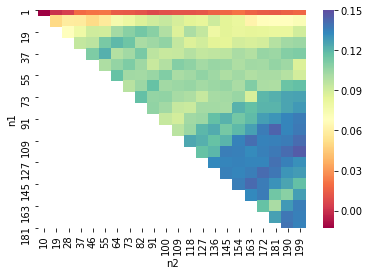

In [59]:
sns.heatmap(hmap, cmap='Spectral')

In [60]:
tr = hmap.stack()

In [61]:
n1 = [i[0] for i in tr.index]
n2 = [i[1] for i in tr.index]

In [62]:
val = []
for (i,j) in zip(n1,n2):
    if i<j:
        val.append(tr.loc[i,j])

In [65]:
import scipy.interpolate as interp
import numpy as np

px, py = np.meshgrid(np.linspace(np.min(n1),np.max(n1),100),np.linspace(np.min(n2),np.max(n2),100))
pz = interp.griddata((n1,n2),val,(px,py),method='cubic')

C:\Users\antho\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  


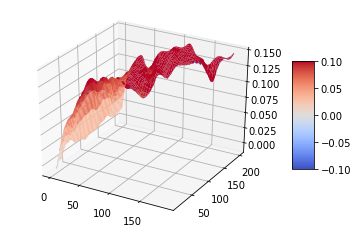

In [66]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(px,py,pz,cmap=cm.coolwarm)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()